# Library




In [1]:
import pandas as pd
import numpy as np
from scipy import signal  
import math as m
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import find_peaks
import joblib
import ast
import pandas as pd
import numpy as np
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks')

In [4]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


# Read file

In [7]:
df_acc=pd.read_csv('/content/drive/MyDrive/Data 2nd phase/Prediction/2Labeled.csv')

In [9]:
df_acc.head()

,latitude,longitude,speed,x,y,z,timestamp,Index,Anomaly,Anomaly_type
0,30.103885,31.244653,0.001058,1.068395,1.530808,9.779167,2022-03-12 11:07:44.827616,51444,unanomaly,unanomaly
1,30.103885,31.244653,0.001058,1.087538,1.501795,9.774382,2022-03-12 11:07:44.827737,51445,unanomaly,unanomaly
2,30.103885,31.244653,0.001058,1.046860,1.497010,9.780363,2022-03-12 11:07:44.827829,51446,unanomaly,unanomaly
3,30.103885,31.244653,0.001058,1.209572,1.494617,9.707084,2022-03-12 11:07:44.827913,51447,unanomaly,unanomaly
4,30.103885,31.244653,0.001058,0.917348,1.518844,9.838987,2022-03-12 11:07:44.827993,51448,unanomaly,unanomaly


In [10]:
df_acc['Anomaly'].value_counts()

unanomaly    65064
anomaly      17733
Name: Anomaly, dtype: int64

# Reorientation



In [11]:
interp_frame=df_acc

In [12]:
interp_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82797 entries, 0 to 82796
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   latitude      82797 non-null  float64
 1   longitude     82797 non-null  float64
 2   speed         82797 non-null  float64
 3   x             82797 non-null  float64
 4   y             82797 non-null  float64
 5   z             82797 non-null  float64
 6   timestamp     82797 non-null  object 
 7   Index         82797 non-null  int64  
 8   Anomaly       82797 non-null  object 
 9   Anomaly_type  82797 non-null  object 
dtypes: float64(6), int64(1), object(3)
memory usage: 6.3+ MB


In [13]:
import math as m
interp_frame['alpha']= interp_frame['y']/interp_frame['z']
interp_frame['alpha']= interp_frame['alpha'].apply(m.atan)

In [14]:
interp_frame['beta']= (interp_frame['y']**2 + interp_frame['z']**2 )
interp_frame['beta']= interp_frame['beta'].apply(m.sqrt)
interp_frame['beta']= (-interp_frame['x']/ interp_frame['beta'])
interp_frame['beta']= interp_frame['beta'].apply(m.atan)

In [15]:
def Rx(theta):
    return np.matrix([[ 1, 0           , 0           ],
                   [ 0, m.cos(theta),-m.sin(theta)],
                   [ 0, m.sin(theta), m.cos(theta)]])
  
def Ry(theta):
    return np.matrix([[ m.cos(theta), 0, m.sin(theta)],
                   [ 0           , 1, 0           ],
                   [-m.sin(theta), 0, m.cos(theta)]])
  
def Rz(theta):
    return np.matrix([[ m.cos(theta), -m.sin(theta), 0 ],
                   [ m.sin(theta), m.cos(theta) , 0 ],
                   [ 0           , 0            , 1 ]])
  
def acc_matrix():
    return np.matrix([[interp_frame['x']],
                    [interp_frame['y']],
                    [interp_frame['z']]])

In [16]:
%%time
x_re=[]
y_re=[]
z_re=[]
for i in range(len(interp_frame)):
    xyz=np.array([[interp_frame['x'].iloc[i]],
                 [interp_frame['y'].iloc[i]],
                 [interp_frame['z'].iloc[i]]])
    xy_reorientation=Ry(interp_frame['beta'].iloc[i]) * Rx(interp_frame['alpha'].iloc[i]) * xyz
    x_re.append(xy_reorientation[0][0])
    y_re.append(xy_reorientation[1][0])
    z_re.append(xy_reorientation[2][0])
# x_re_array,y,z : just conversion
x_re_array=np.array(x_re)
y_re_array=np.array(y_re)
z_re_array=np.array(z_re)

# lists to append values 
x_list=[]
y_list=[]
z_list=[]

for i in range(len(x_re)) :
    x_list.append(x_re_array[i][0][0])
    y_list.append(y_re_array[i][0][0])
    z_list.append(z_re_array[i][0][0])
    

#Dataframe to calc yaw  
stage_2 = pd.DataFrame(
    {'x': x_list,
     'y': y_list,
     'z': z_list
    })
    
#yaw equation
stage_2['yaw']=stage_2['x'] / stage_2['y']
stage_2['yaw']=stage_2['yaw'].apply(m.atan)

#fill na with zeros
stage_2['yaw'].fillna(0,inplace=True)


# final stage of z calculatio
x_re=[]
y_re=[]
z_re=[]
for i in range(len(stage_2)):
    xyz=np.array([[stage_2['x'].iloc[i]],
                 [stage_2['y'].iloc[i]],
                 [stage_2['z'].iloc[i]]])
    z_reorientation=Rz(stage_2['yaw'].iloc[i]) *  xyz
    x_re.append(z_reorientation[0][0])
    y_re.append(z_reorientation[1][0])
    z_re.append(z_reorientation[2][0])
    #print(x_re[i],y_re[i],z_re[i])   
x_re_array=np.array(x_re)
y_re_array=np.array(y_re)
z_re_array=np.array(z_re)
# lists to append values 
x_list=[]
y_list=[]
z_list=[]

for i in range(len(x_re)) :
    x_list.append(x_re_array[i][0][0])
    y_list.append(y_re_array[i][0][0])
    z_list.append(z_re_array[i][0][0])
    
# final results of x' ,y', z'
reorientation_final = pd.DataFrame(
    {'x': x_list,
     'y': y_list,
     'z': z_list
    })


CPU times: user 30.9 s, sys: 1.42 s, total: 32.3 s
Wall time: 31.1 s


# Filter 

In [17]:
sos = signal.butter(10, 15, 'hp',fs = 1000, output= 'sos')
reorientation_final['x_Filtered'] = signal.sosfilt(sos, reorientation_final['x'])
reorientation_final['y_Filtered'] = signal.sosfilt(sos, reorientation_final['y'])
reorientation_final['z_Filtered'] = signal.sosfilt(sos, reorientation_final['z'])


# Labeling

In [18]:
interp_frame.columns

Index(['latitude', 'longitude', 'speed', 'x', 'y', 'z', 'timestamp', 'Index',
       'Anomaly', 'Anomaly_type', 'alpha', 'beta'],
      dtype='object')

In [64]:
reorientation_final['Anomaly'] = interp_frame['Anomaly']
reorientation_final['speed'] = interp_frame['speed']
reorientation_final['latitude'] = interp_frame['latitude']
reorientation_final['longitude'] = interp_frame['longitude']

# Segmentation


In [65]:
df=reorientation_final

In [66]:
df.drop(df.tail(500).index,inplace=True) 
df.drop(df.head(300).index,inplace=True)

In [67]:
%%time
from math import sqrt
##################### lists #################################
speed_list = []
Anomaly_labels_common = []
Anomaly_Type_labels_common = []
x_list_common=[]
y_list_common=[]
z_list_common=[]
long=[]
lat=[]

################### Start windowing ##################################
window_size = 100
step_size = 100
# creating overlaping windows of size window-size 100
for i in range(0,df.shape[0] - window_size, step_size):
    xs = df['x_Filtered'].values[i: i + 100]
    ys =df['y_Filtered'].values[i: i + 100]
    zs =df['z_Filtered'].values[i: i + 100]
    s = df['speed'].values[i: i + 100]
    speed=np.mean(s)
    speed_list.append(speed)  
    Anomaly = df['Anomaly'].values[i: i + 100]
    Long = df['longitude'].values[i: i + 100]
    Lat = df['latitude'].values[i: i + 100]
    #### Appending in list after check  un anomalies label for each list ##############
    x_list_common.append(xs) 
    y_list_common.append(ys) 
    z_list_common.append(zs)
    Anomaly_labels_common.append(stats.mode(Anomaly)[0][0])
    long.append(stats.mode(Long)[0][0])
    lat.append(stats.mode(Lat)[0][0])
 

CPU times: user 945 ms, sys: 4.55 ms, total: 949 ms
Wall time: 1.1 s


In [68]:
x_list=x_list_common
y_list=y_list_common
z_list=z_list_common
Anomaly_labels=Anomaly_labels_common
long_list=long
lat_list=lat
s_list=speed_list

# Feature Extraction

## Time Domain

In [69]:
!pip install antropy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [70]:
%%time
import statistics
import antropy as ent
# Statistical Features on raw x, y and z in time domain
X_train = pd.DataFrame()

# mean
X_train['x_mean'] = pd.Series(x_list).apply(lambda x: x.mean())
X_train['y_mean'] = pd.Series(y_list).apply(lambda x: x.mean())
X_train['z_mean'] = pd.Series(z_list).apply(lambda x: x.mean())
# std dev
X_train['x_std'] = pd.Series(x_list).apply(lambda x: x.std())
X_train['y_std'] = pd.Series(y_list).apply(lambda x: x.std())
X_train['z_std'] = pd.Series(z_list).apply(lambda x: x.std())
# min
X_train['x_min'] = pd.Series(x_list).apply(lambda x: x.min())
X_train['y_min'] = pd.Series(y_list).apply(lambda x: x.min())
X_train['z_min'] = pd.Series(z_list).apply(lambda x: x.min())

# max
X_train['x_max'] = pd.Series(x_list).apply(lambda x: x.max())
X_train['y_max'] = pd.Series(y_list).apply(lambda x: x.max())
X_train['z_max'] = pd.Series(z_list).apply(lambda x: x.max())

# max-min diff
X_train['x_maxmin_diff'] = X_train['x_max'] - X_train['x_min']
X_train['y_maxmin_diff'] = X_train['y_max'] - X_train['y_min']
X_train['z_maxmin_diff'] = X_train['z_max'] - X_train['z_min']

# median
X_train['x_median'] = pd.Series(x_list).apply(lambda x: np.median(x))
X_train['y_median'] = pd.Series(y_list).apply(lambda x: np.median(x))
X_train['z_median'] = pd.Series(z_list).apply(lambda x: np.median(x))

# Variance
X_train['x_variance'] = pd.Series(x_list).apply(lambda x: statistics.variance(x))
X_train['y_variance'] = pd.Series(y_list).apply(lambda x: statistics.variance(x))
X_train['z_variance'] = pd.Series(z_list).apply(lambda x: statistics.variance(x))
# kurtosis
X_train['x_kurtosis'] = pd.Series(x_list).apply(lambda x: stats.kurtosis(x))
X_train['y_kurtosis'] = pd.Series(y_list).apply(lambda x: stats.kurtosis(x))
X_train['z_kurtosis'] = pd.Series(z_list).apply(lambda x: stats.kurtosis(x))

# entropy
X_train['x_entropy'] = pd.Series(x_list).apply(lambda x: ent.perm_entropy(x,normalize=True))
X_train['y_entropy'] = pd.Series(y_list).apply(lambda x: ent.perm_entropy(x,normalize=True))
X_train['z_entropy'] = pd.Series(z_list).apply(lambda x: ent.perm_entropy(x,normalize=True))

# 5th interquartile range
X_train['x_IQR_5th'] = pd.Series(x_list).apply(lambda x: np.percentile(x, 5))
X_train['y_IQR_5th'] = pd.Series(y_list).apply(lambda x: np.percentile(x, 5))
X_train['z_IQR_5th'] = pd.Series(z_list).apply(lambda x: np.percentile(x, 5))

# 25th interquartile range
X_train['x_IQR_25th'] = pd.Series(x_list).apply(lambda x: np.percentile(x, 25))
X_train['y_IQR_25th'] = pd.Series(y_list).apply(lambda x: np.percentile(x, 25))
X_train['z_IQR_25th'] = pd.Series(z_list).apply(lambda x: np.percentile(x, 25))

# 75th interquartile range
X_train['x_IQR_75th'] = pd.Series(x_list).apply(lambda x: np.percentile(x, 75))
X_train['y_IQR_75th'] = pd.Series(y_list).apply(lambda x: np.percentile(x, 75))
X_train['z_IQR_75th'] = pd.Series(z_list).apply(lambda x: np.percentile(x, 75))

# 95th interquartile range
X_train['x_IQR_95th'] = pd.Series(x_list).apply(lambda x: np.percentile(x, 95))
X_train['y_IQR_95th'] = pd.Series(y_list).apply(lambda x: np.percentile(x, 95))
X_train['z_IQR_95th'] = pd.Series(z_list).apply(lambda x: np.percentile(x, 95))

# RMS
X_train['x_RMS'] = pd.Series(x_list).apply(lambda x: np.sqrt(np.mean(x**2)))
X_train['y_RMS'] = pd.Series(y_list).apply(lambda x: np.sqrt(np.mean(x**2)))
X_train['z_RMS'] = pd.Series(z_list).apply(lambda x: np.sqrt(np.mean(x**2)))

# skewness
X_train['x_skewness'] = pd.Series(x_list).apply(lambda x: stats.skew(x))
X_train['y_skewness'] = pd.Series(y_list).apply(lambda x: stats.skew(x))
X_train['z_skewness'] = pd.Series(z_list).apply(lambda x: stats.skew(x))

#  number of zero crossing 
X_train['x_no_zero_cross'] = pd.Series(x_list).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum())
X_train['y_no_zero_cross'] = pd.Series(y_list).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum())
X_train['z_no_zero_cross'] = pd.Series(z_list).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum())
#  number of mean crossing 
X_train['x_no_mean_cross'] = pd.Series(x_list).apply(lambda x: ((x[:-1] * x[1:]) < np.mean(x)).sum())
X_train['y_no_mean_cross'] = pd.Series(y_list).apply(lambda x: ((x[:-1] * x[1:]) < np.mean(x)).sum())
X_train['z_no_mean_cross'] = pd.Series(z_list).apply(lambda x: ((x[:-1] * x[1:]) < np.mean(x)).sum())                                                     


CPU times: user 6.06 s, sys: 31.2 ms, total: 6.09 s
Wall time: 6.15 s


## Frequency Domain

In [71]:
t_n = 10
N = 100
T = t_n / N
f_s = 1/T


In [72]:
# converting the signals from time domain to frequency domain using FFT fn
from scipy.fft import fft
def get_fft_values(y_values, T, N, f_s):
    fft_values_ = fft(y_values)
    fft_values = 2.0/N * np.abs(fft_values_[0:N//2])
    return  fft_values

In [73]:
# converting the signals from time domain to frequency domain using PSD fn
from scipy.signal import welch

def get_psd_values(y_values, T, N, f_s):
    f_value,psd_values = welch(y_values, fs=f_s)
    return  psd_values

In [74]:
# converting the signals from time domain to frequency domain using Autocorr fn
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    return result[len(result)//2:]
 
def get_autocorr_values(y_values, T, N, f_s):
    autocorr_values = autocorr(y_values)
    return  autocorr_values

In [75]:
# function gain width and height peaks
from scipy.signal import  peak_widths
from itertools import islice
def take(n, iterable):
    return list(islice(iterable, n))
def hig_wid_peak(signal):
    signal_peak=find_peaks(signal)[0]
    Peak_ind_signal_value={}
    for i in signal_peak:
        Peak_ind_signal_value[i]=[]
        Peak_ind_signal_value[i].append(signal[i])
    sorted_dic={k: v for k, v in sorted(Peak_ind_signal_value.items(), key=lambda item: item[1],reverse=True)}
    if len(sorted_dic)<5:
        first_5_sorted=list(sorted_dic.items())
    else:
        first_5_sorted=take(5, sorted_dic.items())
    peak_ind=[]
    peak_height=[]
    for i in range(len(first_5_sorted)):
        peak_ind.append(first_5_sorted[i][0])
        peak_height.append(abs(first_5_sorted[i][1][0]))
    peak_width=peak_widths(signal,peak_ind,rel_height=1)
    peak_width_list=peak_width[0]
    peak_height_final=[]
    peak_width_final=[]
    for i in range(0,5):
        try:
            peak_height_final.append(peak_height[i])
            peak_width_final.append(peak_width_list[i])
        except:
            peak_height_final.append(0)
            peak_width_final.append(0)
    return peak_height_final,peak_width_final    

In [76]:
def AppendInDF(signal,column_name):
    list_height_1=[]
    list_height_2=[]
    list_height_3=[]
    list_height_4=[]
    list_height_5=[]
    ################################################
    list_width_1=[]
    list_width_2=[]
    list_width_3=[]
    list_width_4=[]
    list_width_5=[]
    ################################################
    for i in range(len(signal)):
        list_height_1.append(signal[i][0][0])
        list_height_2.append(signal[i][0][1])
        list_height_3.append(signal[i][0][2])
        list_height_4.append(signal[i][0][3])
        list_height_5.append(signal[i][0][4])
 #####################################################       
        list_width_1.append(signal[i][1][0])
        list_width_2.append(signal[i][1][1])
        list_width_3.append(signal[i][1][2])
        list_width_4.append(signal[i][1][3])
        list_width_5.append(signal[i][1][4])
  #####################################################      
    X_train[column_name+'_height_'+str(1)]=list_height_1
    X_train[column_name+'_height_'+str(2)]=list_height_2 
    X_train[column_name+'_height_'+str(3)]=list_height_3 
    X_train[column_name+'_height_'+str(4)]=list_height_4 
    X_train[column_name+'_height_'+str(5)]=list_height_5
#######################################################
    X_train[column_name+'_width_'+str(1)]=list_width_1
    X_train[column_name+'_width_'+str(2)]=list_width_2 
    X_train[column_name+'_width_'+str(3)]=list_width_3 
    X_train[column_name+'_width_'+str(4)]=list_width_4 
    X_train[column_name+'_width_'+str(5)]=list_width_5 

In [77]:
%%time
# converting the signals from time domain to frequency domain using FFT
x_list_fft = pd.Series(x_list).apply(lambda x: get_fft_values(x, T, N, f_s))
y_list_fft = pd.Series(y_list).apply(lambda x: get_fft_values(x, T, N, f_s))
z_list_fft = pd.Series(z_list).apply(lambda x: get_fft_values(x, T, N, f_s))
# converting the signals from time domain to frequency domain using PSD
x_list_PSD = pd.Series(x_list).apply(lambda x: get_psd_values(x, T, N, f_s))
y_list_PSD = pd.Series(y_list).apply(lambda x: get_psd_values(x, T, N, f_s))
z_list_PSD = pd.Series(z_list).apply(lambda x: get_psd_values(x, T, N, f_s))
# converting the signals from time domain to frequency domain using autocorr
x_list_autocorr = pd.Series(x_list).apply(lambda x: get_autocorr_values(x, T, N, f_s))
y_list_autocorr = pd.Series(y_list).apply(lambda x: get_autocorr_values(x, T, N, f_s))
z_list_autocorr = pd.Series(z_list).apply(lambda x: get_autocorr_values(x, T, N, f_s))

/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 256 is greater than input length  = 100, using nperseg = 100
  .format(nperseg, input_length))


CPU times: user 1.15 s, sys: 66.6 ms, total: 1.22 s
Wall time: 1.1 s


In [78]:
%%time
x_list_fft_phw=pd.Series(x_list_fft).apply(lambda x: hig_wid_peak(x))
y_list_fft_phw=pd.Series(y_list_fft).apply(lambda x: hig_wid_peak(x))
z_list_fft_phw=pd.Series(z_list_fft).apply(lambda x: hig_wid_peak(x))

CPU times: user 323 ms, sys: 15.8 ms, total: 339 ms
Wall time: 361 ms


In [79]:
%%time
AppendInDF(x_list_fft_phw,'x_fft')
AppendInDF(y_list_fft_phw,'y_fft')
AppendInDF(z_list_fft_phw,'z_fft')

CPU times: user 104 ms, sys: 893 µs, total: 104 ms
Wall time: 110 ms


In [80]:
%%time
x_list_PSD_phw=pd.Series(x_list_PSD).apply(lambda x: hig_wid_peak(x))
y_list_PSD_phw=pd.Series(y_list_PSD).apply(lambda x: hig_wid_peak(x))
z_list_PSD_phw=pd.Series(z_list_PSD).apply(lambda x: hig_wid_peak(x))

CPU times: user 186 ms, sys: 6.05 ms, total: 192 ms
Wall time: 193 ms


In [81]:
%%time
AppendInDF(x_list_PSD_phw,'x_PSD')
AppendInDF(y_list_PSD_phw,'y_PSD')
AppendInDF(z_list_PSD_phw,'z_PSD')

CPU times: user 104 ms, sys: 0 ns, total: 104 ms
Wall time: 107 ms


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, u

In [82]:
%%time
x_list_autocorr_phw=pd.Series(x_list_autocorr).apply(lambda x: hig_wid_peak(x))
y_list_autocorr_phw=pd.Series(y_list_autocorr).apply(lambda x: hig_wid_peak(x))
z_list_autocorr_phw=pd.Series(z_list_autocorr).apply(lambda x: hig_wid_peak(x))

CPU times: user 403 ms, sys: 10.8 ms, total: 414 ms
Wall time: 434 ms


In [83]:
%%time
AppendInDF(x_list_autocorr_phw,'x_autocorr')
AppendInDF(y_list_autocorr_phw,'y_autocorr')
AppendInDF(z_list_autocorr_phw,'z_autocorr')

CPU times: user 126 ms, sys: 2.84 ms, total: 129 ms
Wall time: 142 ms


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, u

## Wavelet Domain

In [84]:
from pywt import wavedec
x_list_rbio = pd.Series(x_list).apply(lambda x: wavedec(x, 'rbio3.1', level = 3))
y_list_rbio = pd.Series(y_list).apply(lambda x: wavedec(x, 'rbio3.1', level = 3))
z_list_rbio = pd.Series(z_list).apply(lambda x: wavedec(x, 'rbio3.1', level = 3))

In [85]:
%%time
x_list_rbio_cA1=[]
x_list_rbio_cD3=[]
x_list_rbio_cD2=[]
x_list_rbio_cD1=[]
################################################
for i in range(len(x_list_rbio)):
    x_list_rbio_cA1.append(x_list_rbio[i][0])
    x_list_rbio_cD3.append(x_list_rbio[i][1])
    x_list_rbio_cD2.append(x_list_rbio[i][2])
    x_list_rbio_cD1.append(x_list_rbio[i][3])

CPU times: user 14.7 ms, sys: 955 µs, total: 15.7 ms
Wall time: 15.7 ms


In [86]:
%%time
y_list_rbio_cA1=[]
y_list_rbio_cD3=[]
y_list_rbio_cD2=[]
y_list_rbio_cD1=[]
################################################
for i in range(len(y_list_rbio)):
    y_list_rbio_cA1.append(y_list_rbio[i][0])
    y_list_rbio_cD3.append(y_list_rbio[i][1])
    y_list_rbio_cD2.append(y_list_rbio[i][2])
    y_list_rbio_cD1.append(y_list_rbio[i][3])

CPU times: user 13.4 ms, sys: 0 ns, total: 13.4 ms
Wall time: 13.6 ms


In [87]:
%%time
z_list_rbio_cA1=[]
z_list_rbio_cD3=[]
z_list_rbio_cD2=[]
z_list_rbio_cD1=[]
################################################
for i in range(len(y_list_rbio)):
    z_list_rbio_cA1.append(z_list_rbio[i][0])
    z_list_rbio_cD3.append(z_list_rbio[i][1])
    z_list_rbio_cD2.append(z_list_rbio[i][2])
    z_list_rbio_cD1.append(z_list_rbio[i][3])

CPU times: user 16.6 ms, sys: 10 µs, total: 16.6 ms
Wall time: 19.6 ms


In [88]:
%%time
import statistics
import antropy as ent


# mean
X_train['x_rbio_cA1_mean'] = pd.Series(x_list_rbio_cA1).apply(lambda x: x.mean());
X_train['x_rbio_cD3_mean'] = pd.Series(x_list_rbio_cD3).apply(lambda x: x.mean());
X_train['x_rbio_cD2_mean'] = pd.Series(x_list_rbio_cD2).apply(lambda x: x.mean());
X_train['x_rbio_cD1_mean'] = pd.Series(x_list_rbio_cD1).apply(lambda x: x.mean());
#####################################################################################
X_train['y_rbio_cA1_mean'] = pd.Series(y_list_rbio_cA1).apply(lambda x: x.mean());
X_train['y_rbio_cD3_mean'] = pd.Series(y_list_rbio_cD3).apply(lambda x: x.mean());
X_train['y_rbio_cD2_mean'] = pd.Series(y_list_rbio_cD2).apply(lambda x: x.mean());
X_train['y_rbio_cD1_mean'] = pd.Series(y_list_rbio_cD1).apply(lambda x: x.mean());
#####################################################################################
X_train['z_rbio_cA1_mean'] = pd.Series(z_list_rbio_cA1).apply(lambda x: x.mean());
X_train['z_rbio_cD3_mean'] = pd.Series(z_list_rbio_cD3).apply(lambda x: x.mean());
X_train['z_rbio_cD2_mean'] = pd.Series(z_list_rbio_cD2).apply(lambda x: x.mean());
X_train['z_rbio_cD1_mean'] = pd.Series(z_list_rbio_cD1).apply(lambda x: x.mean());

# std dev
X_train['x_rbio_cA1_std'] = pd.Series(x_list_rbio_cA1).apply(lambda x: x.std());
X_train['x_rbio_cD3_std'] = pd.Series(x_list_rbio_cD3).apply(lambda x: x.std());
X_train['x_rbio_cD2_std'] = pd.Series(x_list_rbio_cD2).apply(lambda x: x.std());
X_train['x_rbio_cD1_std'] = pd.Series(x_list_rbio_cD1).apply(lambda x: x.std());
#####################################################################################
X_train['y_rbio_cA1_std'] = pd.Series(y_list_rbio_cA1).apply(lambda x: x.std());
X_train['y_rbio_cD3_std'] = pd.Series(y_list_rbio_cD3).apply(lambda x: x.std());
X_train['y_rbio_cD2_std'] = pd.Series(y_list_rbio_cD2).apply(lambda x: x.std());
X_train['y_rbio_cD1_std'] = pd.Series(y_list_rbio_cD1).apply(lambda x: x.std());
#####################################################################################
X_train['z_rbio_cA1_std'] = pd.Series(z_list_rbio_cA1).apply(lambda x: x.std());
X_train['z_rbio_cD3_std'] = pd.Series(z_list_rbio_cD3).apply(lambda x: x.std());
X_train['z_rbio_cD2_std'] = pd.Series(z_list_rbio_cD2).apply(lambda x: x.std());
X_train['z_rbio_cD1_std'] = pd.Series(z_list_rbio_cD1).apply(lambda x: x.std());

# min
X_train['x_rbio_cA1_min'] = pd.Series(x_list_rbio_cA1).apply(lambda x: x.min());
X_train['x_rbio_cD3_min'] = pd.Series(x_list_rbio_cD3).apply(lambda x: x.min());
X_train['x_rbio_cD2_min'] = pd.Series(x_list_rbio_cD2).apply(lambda x: x.min());
X_train['x_rbio_cD1_min'] = pd.Series(x_list_rbio_cD1).apply(lambda x: x.min());
#####################################################################################
X_train['y_rbio_cA1_min'] = pd.Series(y_list_rbio_cA1).apply(lambda x: x.min());
X_train['y_rbio_cD3_min'] = pd.Series(y_list_rbio_cD3).apply(lambda x: x.min());
X_train['y_rbio_cD2_min'] = pd.Series(y_list_rbio_cD2).apply(lambda x: x.min());
X_train['y_rbio_cD1_min'] = pd.Series(y_list_rbio_cD1).apply(lambda x: x.min());
#####################################################################################
X_train['z_rbio_cA1_min'] = pd.Series(z_list_rbio_cA1).apply(lambda x: x.min());
X_train['z_rbio_cD3_min'] = pd.Series(z_list_rbio_cD3).apply(lambda x: x.min());
X_train['z_rbio_cD2_min'] = pd.Series(z_list_rbio_cD2).apply(lambda x: x.min());
X_train['z_rbio_cD1_min'] = pd.Series(z_list_rbio_cD1).apply(lambda x: x.min());


# max
X_train['x_rbio_cA1_max'] = pd.Series(x_list_rbio_cA1).apply(lambda x: x.max());
X_train['x_rbio_cD3_max'] = pd.Series(x_list_rbio_cD3).apply(lambda x: x.max());
X_train['x_rbio_cD2_max'] = pd.Series(x_list_rbio_cD2).apply(lambda x: x.max());
X_train['x_rbio_cD1_max'] = pd.Series(x_list_rbio_cD1).apply(lambda x: x.max());
#####################################################################################
X_train['y_rbio_cA1_max'] = pd.Series(y_list_rbio_cA1).apply(lambda x: x.max());
X_train['y_rbio_cD3_max'] = pd.Series(y_list_rbio_cD3).apply(lambda x: x.max());
X_train['y_rbio_cD2_max'] = pd.Series(y_list_rbio_cD2).apply(lambda x: x.max());
X_train['y_rbio_cD1_max'] = pd.Series(y_list_rbio_cD1).apply(lambda x: x.max());
#####################################################################################
X_train['z_rbio_cA1_max'] = pd.Series(z_list_rbio_cA1).apply(lambda x: x.max());
X_train['z_rbio_cD3_max'] = pd.Series(z_list_rbio_cD3).apply(lambda x: x.max());
X_train['z_rbio_cD2_max'] = pd.Series(z_list_rbio_cD2).apply(lambda x: x.max());
X_train['z_rbio_cD1_max'] = pd.Series(z_list_rbio_cD1).apply(lambda x: x.max());

# max-min diff
X_train['x_rbio_cA1_maxmin_diff'] = X_train['x_rbio_cA1_max'] - X_train['x_rbio_cA1_min'];
X_train['x_rbio_cD3_maxmin_diff'] = X_train['x_rbio_cD3_max'] - X_train['x_rbio_cD3_min'];
X_train['x_rbio_cD2_maxmin_diff'] = X_train['x_rbio_cD2_max'] - X_train['x_rbio_cD2_min'];
X_train['x_rbio_cD1_maxmin_diff'] = X_train['x_rbio_cD1_max'] - X_train['x_rbio_cD1_min'];
#####################################################################################
X_train['y_rbio_cA1_maxmin_diff'] = X_train['y_rbio_cA1_max'] - X_train['y_rbio_cA1_min'];
X_train['y_rbio_cD3_maxmin_diff'] = X_train['y_rbio_cD3_max'] - X_train['y_rbio_cD3_min'];
X_train['y_rbio_cD2_maxmin_diff'] = X_train['y_rbio_cD2_max'] - X_train['y_rbio_cD2_min'];
X_train['y_rbio_cD1_maxmin_diff'] = X_train['y_rbio_cD1_max'] - X_train['y_rbio_cD1_min'];
#####################################################################################;
X_train['z_rbio_cA1_maxmin_diff'] = X_train['z_rbio_cA1_max'] - X_train['z_rbio_cA1_min'];
X_train['z_rbio_cD3_maxmin_diff'] = X_train['z_rbio_cD3_max'] - X_train['z_rbio_cD3_min'];
X_train['z_rbio_cD2_maxmin_diff'] = X_train['z_rbio_cD2_max'] - X_train['z_rbio_cD2_min'];
X_train['z_rbio_cD1_maxmin_diff'] = X_train['z_rbio_cD1_max'] - X_train['z_rbio_cD1_min'];

# median
X_train['x_rbio_cA1_median'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.median(x));
X_train['x_rbio_cD3_median'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.median(x));
X_train['x_rbio_cD2_median'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.median(x));
X_train['x_rbio_cD1_median'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.median(x));
#####################################################################################
X_train['y_rbio_cA1_median'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.median(x));
X_train['y_rbio_cD3_median'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.median(x));
X_train['y_rbio_cD2_median'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.median(x));
X_train['y_rbio_cD1_median'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.median(x));
#####################################################################################
X_train['z_rbio_cA1_median'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.median(x));
X_train['z_rbio_cD3_median'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.median(x));
X_train['z_rbio_cD2_median'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.median(x));
X_train['z_rbio_cD1_median'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.median(x));

# Variance
X_train['x_rbio_cA1_variance'] = pd.Series(x_list_rbio_cA1).apply(lambda x: statistics.variance(x));
X_train['x_rbio_cD3_variance'] = pd.Series(x_list_rbio_cD3).apply(lambda x: statistics.variance(x));
X_train['x_rbio_cD2_variance'] = pd.Series(x_list_rbio_cD2).apply(lambda x: statistics.variance(x));
X_train['x_rbio_cD1_variance'] = pd.Series(x_list_rbio_cD1).apply(lambda x: statistics.variance(x));
#####################################################################################
X_train['y_rbio_cA1_variance'] = pd.Series(y_list_rbio_cA1).apply(lambda x: statistics.variance(x));
X_train['y_rbio_cD3_variance'] = pd.Series(y_list_rbio_cD3).apply(lambda x: statistics.variance(x));
X_train['y_rbio_cD2_variance'] = pd.Series(y_list_rbio_cD2).apply(lambda x: statistics.variance(x));
X_train['y_rbio_cD1_variance'] = pd.Series(y_list_rbio_cD1).apply(lambda x: statistics.variance(x));
#####################################################################################
X_train['z_rbio_cA1_variance'] = pd.Series(z_list_rbio_cA1).apply(lambda x: statistics.variance(x));
X_train['z_rbio_cD3_variance'] = pd.Series(z_list_rbio_cD3).apply(lambda x: statistics.variance(x));
X_train['z_rbio_cD2_variance'] = pd.Series(z_list_rbio_cD2).apply(lambda x: statistics.variance(x));
X_train['z_rbio_cD1_variance'] = pd.Series(z_list_rbio_cD1).apply(lambda x: statistics.variance(x));

# kurtosis
X_train['x_rbio_cA1_kurtosis'] = pd.Series(x_list_rbio_cA1).apply(lambda x: stats.kurtosis(x));
X_train['x_rbio_cD3_kurtosis'] = pd.Series(x_list_rbio_cD3).apply(lambda x: stats.kurtosis(x));
X_train['x_rbio_cD2_kurtosis'] = pd.Series(x_list_rbio_cD2).apply(lambda x: stats.kurtosis(x));
X_train['x_rbio_cD1_kurtosis'] = pd.Series(x_list_rbio_cD1).apply(lambda x: stats.kurtosis(x));
#####################################################################################
X_train['y_rbio_cA1_kurtosis'] = pd.Series(y_list_rbio_cA1).apply(lambda x: stats.kurtosis(x));
X_train['y_rbio_cD3_kurtosis'] = pd.Series(y_list_rbio_cD3).apply(lambda x: stats.kurtosis(x));
X_train['y_rbio_cD2_kurtosis'] = pd.Series(y_list_rbio_cD2).apply(lambda x: stats.kurtosis(x));
X_train['y_rbio_cD1_kurtosis'] = pd.Series(y_list_rbio_cD1).apply(lambda x: stats.kurtosis(x));
#####################################################################################
X_train['z_rbio_cA1_kurtosis'] = pd.Series(z_list_rbio_cA1).apply(lambda x: stats.kurtosis(x));
X_train['z_rbio_cD3_kurtosis'] = pd.Series(z_list_rbio_cD3).apply(lambda x: stats.kurtosis(x));
X_train['z_rbio_cD2_kurtosis'] = pd.Series(z_list_rbio_cD2).apply(lambda x: stats.kurtosis(x));
X_train['z_rbio_cD1_kurtosis'] = pd.Series(z_list_rbio_cD1).apply(lambda x: stats.kurtosis(x));


# entropy
X_train['x_rbio_cA1_entropy'] = pd.Series(x_list_rbio_cA1).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['x_rbio_cD3_entropy'] = pd.Series(x_list_rbio_cD3).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['x_rbio_cD2_entropy'] = pd.Series(x_list_rbio_cD2).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['x_rbio_cD1_entropy'] = pd.Series(x_list_rbio_cD1).apply(lambda x: ent.perm_entropy(x,normalize=True));
#####################################################################################
X_train['y_rbio_cA1_entropy'] = pd.Series(y_list_rbio_cA1).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['y_rbio_cD3_entropy'] = pd.Series(y_list_rbio_cD3).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['y_rbio_cD2_entropy'] = pd.Series(y_list_rbio_cD2).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['y_rbio_cD1_entropy'] = pd.Series(y_list_rbio_cD1).apply(lambda x: ent.perm_entropy(x,normalize=True));
#####################################################################################
X_train['z_rbio_cA1_entropy'] = pd.Series(z_list_rbio_cA1).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['z_rbio_cD3_entropy'] = pd.Series(z_list_rbio_cD3).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['z_rbio_cD2_entropy'] = pd.Series(z_list_rbio_cD2).apply(lambda x: ent.perm_entropy(x,normalize=True));
X_train['z_rbio_cD1_entropy'] = pd.Series(z_list_rbio_cD1).apply(lambda x: ent.perm_entropy(x,normalize=True));


# 5th interquartile range
X_train['x_rbio_cA1_IQR_5th'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.percentile(x, 5));
X_train['x_rbio_cD3_IQR_5th'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.percentile(x, 5));
X_train['x_rbio_cD2_IQR_5th'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.percentile(x, 5));
X_train['x_rbio_cD1_IQR_5th'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.percentile(x, 5));
#####################################################################################
X_train['y_rbio_cA1_IQR_5th'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.percentile(x, 5));
X_train['y_rbio_cD3_IQR_5th'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.percentile(x, 5));
X_train['y_rbio_cD2_IQR_5th'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.percentile(x, 5));
X_train['y_rbio_cD1_IQR_5th'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.percentile(x, 5));
#####################################################################################
X_train['z_rbio_cA1_IQR_5th'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.percentile(x, 5));
X_train['z_rbio_cD3_IQR_5th'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.percentile(x, 5));
X_train['z_rbio_cD2_IQR_5th'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.percentile(x, 5));
X_train['z_rbio_cD1_IQR_5th'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.percentile(x, 5));


# 25th interquartile range
X_train['x_rbio_cA1_IQR_25th'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.percentile(x, 25));
X_train['x_rbio_cD3_IQR_25th'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.percentile(x, 25));
X_train['x_rbio_cD2_IQR_25th'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.percentile(x, 25));
X_train['x_rbio_cD1_IQR_25th'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.percentile(x, 25));
#####################################################################################
X_train['y_rbio_cA1_IQR_25th'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.percentile(x, 25));
X_train['y_rbio_cD3_IQR_25th'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.percentile(x, 25));
X_train['y_rbio_cD2_IQR_25th'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.percentile(x, 25));
X_train['y_rbio_cD1_IQR_25th'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.percentile(x, 25));
#####################################################################################
X_train['z_rbio_cA1_IQR_25th'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.percentile(x, 25));
X_train['z_rbio_cD3_IQR_25th'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.percentile(x, 25));
X_train['z_rbio_cD2_IQR_25th'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.percentile(x, 25));
X_train['z_rbio_cD1_IQR_25th'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.percentile(x, 25));


# 75th interquartile range
X_train['x_rbio_cA1_IQR_75th'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.percentile(x, 75));
X_train['x_rbio_cD3_IQR_75th'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.percentile(x, 75));
X_train['x_rbio_cD2_IQR_75th'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.percentile(x, 75));
X_train['x_rbio_cD1_IQR_75th'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.percentile(x, 75));
#####################################################################################
X_train['y_rbio_cA1_IQR_75th'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.percentile(x, 75));
X_train['y_rbio_cD3_IQR_75th'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.percentile(x, 75));
X_train['y_rbio_cD2_IQR_75th'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.percentile(x, 75));
X_train['y_rbio_cD1_IQR_75th'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.percentile(x, 75));
#####################################################################################
X_train['z_rbio_cA1_IQR_75th'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.percentile(x, 75));
X_train['z_rbio_cD3_IQR_75th'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.percentile(x, 75));
X_train['z_rbio_cD2_IQR_75th'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.percentile(x, 75));
X_train['z_rbio_cD1_IQR_75th'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.percentile(x, 75));


# 95th interquartile range
X_train['x_rbio_cA1_IQR_95th'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.percentile(x, 95));
X_train['x_rbio_cD3_IQR_95th'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.percentile(x, 95));
X_train['x_rbio_cD2_IQR_95th'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.percentile(x, 95));
X_train['x_rbio_cD1_IQR_95th'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.percentile(x, 95));
#####################################################################################
X_train['y_rbio_cA1_IQR_95th'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.percentile(x, 95));
X_train['y_rbio_cD3_IQR_95th'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.percentile(x, 95));
X_train['y_rbio_cD2_IQR_95th'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.percentile(x, 95));
X_train['y_rbio_cD1_IQR_95th'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.percentile(x, 95));
#####################################################################################
X_train['z_rbio_cA1_IQR_95th'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.percentile(x, 95));
X_train['z_rbio_cD3_IQR_95th'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.percentile(x, 95));
X_train['z_rbio_cD2_IQR_95th'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.percentile(x, 95));
X_train['z_rbio_cD1_IQR_95th'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.percentile(x, 95));


# RMS
X_train['x_rbio_cA1_RMS'] = pd.Series(x_list_rbio_cA1).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['x_rbio_cD3_RMS'] = pd.Series(x_list_rbio_cD3).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['x_rbio_cD2_RMS'] = pd.Series(x_list_rbio_cD2).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['x_rbio_cD1_RMS'] = pd.Series(x_list_rbio_cD1).apply(lambda x: np.sqrt(np.mean(x**2)));
#####################################################################################
X_train['y_rbio_cA1_RMS'] = pd.Series(y_list_rbio_cA1).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['y_rbio_cD3_RMS'] = pd.Series(y_list_rbio_cD3).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['y_rbio_cD2_RMS'] = pd.Series(y_list_rbio_cD2).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['y_rbio_cD1_RMS'] = pd.Series(y_list_rbio_cD1).apply(lambda x: np.sqrt(np.mean(x**2)));
#####################################################################################
X_train['z_rbio_cA1_RMS'] = pd.Series(z_list_rbio_cA1).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['z_rbio_cD3_RMS'] = pd.Series(z_list_rbio_cD3).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['z_rbio_cD2_RMS'] = pd.Series(z_list_rbio_cD2).apply(lambda x: np.sqrt(np.mean(x**2)));
X_train['z_rbio_cD1_RMS'] = pd.Series(z_list_rbio_cD1).apply(lambda x: np.sqrt(np.mean(x**2)));


# skewness
X_train['x_rbio_cA1_skewness'] = pd.Series(x_list_rbio_cA1).apply(lambda x: stats.skew(x));
X_train['x_rbio_cD3_skewness'] = pd.Series(x_list_rbio_cD3).apply(lambda x: stats.skew(x));
X_train['x_rbio_cD2_skewness'] = pd.Series(x_list_rbio_cD2).apply(lambda x: stats.skew(x));
X_train['x_rbio_cD1_skewness'] = pd.Series(x_list_rbio_cD1).apply(lambda x: stats.skew(x));
#####################################################################################
X_train['y_rbio_cA1_skewness'] = pd.Series(y_list_rbio_cA1).apply(lambda x: stats.skew(x));
X_train['y_rbio_cD3_skewness'] = pd.Series(y_list_rbio_cD3).apply(lambda x: stats.skew(x));
X_train['y_rbio_cD2_skewness'] = pd.Series(y_list_rbio_cD2).apply(lambda x: stats.skew(x));
X_train['y_rbio_cD1_skewness'] = pd.Series(y_list_rbio_cD1).apply(lambda x: stats.skew(x));
#####################################################################################
X_train['z_rbio_cA1_skewness'] = pd.Series(z_list_rbio_cA1).apply(lambda x: stats.skew(x));
X_train['z_rbio_cD3_skewness'] = pd.Series(z_list_rbio_cD3).apply(lambda x: stats.skew(x));
X_train['z_rbio_cD2_skewness'] = pd.Series(z_list_rbio_cD2).apply(lambda x: stats.skew(x));
X_train['z_rbio_cD1_skewness'] = pd.Series(z_list_rbio_cD1).apply(lambda x: stats.skew(x));


#  number of zero crossing 
X_train['x_rbio_cA1_no_zero_cross'] = pd.Series(x_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['x_rbio_cD3_no_zero_cross'] = pd.Series(x_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['x_rbio_cD2_no_zero_cross'] = pd.Series(x_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['x_rbio_cD1_no_zero_cross'] = pd.Series(x_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
#####################################################################################
X_train['y_rbio_cA1_no_zero_cross'] = pd.Series(y_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['y_rbio_cD3_no_zero_cross'] = pd.Series(y_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['y_rbio_cD2_no_zero_cross'] = pd.Series(y_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['y_rbio_cD1_no_zero_cross'] = pd.Series(y_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
#####################################################################################
X_train['z_rbio_cA1_no_zero_cross'] = pd.Series(z_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['z_rbio_cD3_no_zero_cross'] = pd.Series(z_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['z_rbio_cD2_no_zero_cross'] = pd.Series(z_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());
X_train['z_rbio_cD1_no_zero_cross'] = pd.Series(z_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) < 0).sum());


#  number of mean crossing 
X_train['x_rbio_cA1_no_mean_cross'] = pd.Series(x_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['x_rbio_cD3_no_mean_cross'] = pd.Series(x_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['x_rbio_cD2_no_mean_cross'] = pd.Series(x_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['x_rbio_cD1_no_mean_cross'] = pd.Series(x_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
#####################################################################################
X_train['y_rbio_cA1_no_mean_cross'] = pd.Series(y_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['y_rbio_cD3_no_mean_cross'] = pd.Series(y_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['y_rbio_cD2_no_mean_cross'] = pd.Series(y_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['y_rbio_cD1_no_mean_cross'] = pd.Series(y_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
#####################################################################################
X_train['z_rbio_cA1_no_mean_cross'] = pd.Series(z_list_rbio_cA1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['z_rbio_cD3_no_mean_cross'] = pd.Series(z_list_rbio_cD3).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['z_rbio_cD2_no_mean_cross'] = pd.Series(z_list_rbio_cD2).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
X_train['z_rbio_cD1_no_mean_cross'] = pd.Series(z_list_rbio_cD1).apply(lambda x: ((x[:-1] * x[1:]) <  np.mean(x)).sum());
       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragme

CPU times: user 26.7 s, sys: 224 ms, total: 26.9 s
Wall time: 33.7 s


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:280: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:282: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:283: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame

In [89]:

X_train['Anomaly_labels']=Anomaly_labels
X_train['longitude']=long_list
X_train['latitude']=lat_list
X_train['speed']=s_list

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all

# Run Saved models

In [98]:
data_unseen=X_train
rf_from_joblieb = joblib.load('/content/drive/MyDrive/Data 2nd phase/Prediction/Final et Model 1APR2022.pkl');
et_from_joblib = joblib.load('/content/drive/MyDrive/Data 2nd phase/Prediction/Final et Model 1APR2022.pkl');
lgdb_from_joblib = joblib.load('/content/drive/MyDrive/Data 2nd phase/Prediction/Final lightgbm Model  1APR2022.pkl');

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator LabelEncoder from version 0.23.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator SimpleImputer from version 0.23.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.23.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk

In [99]:
data_unseen

,x_mean,y_mean,z_mean,x_std,y_std,z_std,x_min,y_min,z_min,x_max,y_max,z_max,x_maxmin_diff,y_maxmin_diff,z_maxmin_diff,x_median,y_median,z_median,x_variance,y_variance,z_variance,x_kurtosis,y_kurtosis,z_kurtosis,x_entropy,y_entropy,z_entropy,x_IQR_5th,y_IQR_5th,z_IQR_5th,x_IQR_25th,y_IQR_25th,z_IQR_25th,x_IQR_75th,y_IQR_75th,z_IQR_75th,x_IQR_95th,y_IQR_95th,z_IQR_95th,x_RMS,y_RMS,z_RMS,x_skewness,y_skewness,z_skewness,x_no_zero_cross,y_no_zero_cross,z_no_zero_cross,x_no_mean_cross,y_no_mean_cross,z_no_mean_cross,x_fft_height_1,x_fft_height_2,x_fft_height_3,x_fft_height_4,x_fft_height_5,x_fft_width_1,x_fft_width_2,x_fft_width_3,x_fft_width_4,x_fft_width_5,y_fft_height_1,y_fft_height_2,y_fft_height_3,y_fft_height_4,y_fft_height_5,y_fft_width_1,y_fft_width_2,y_fft_width_3,y_fft_width_4,y_fft_width_5,z_fft_height_1,z_fft_height_2,z_fft_height_3,z_fft_height_4,z_fft_height_5,z_fft_width_1,z_fft_width_2,z_fft_width_3,z_fft_width_4,z_fft_width_5,x_PSD_height_1,x_PSD_height_2,x_PSD_height_3,x_PSD_height_4,x_PSD_height_5,x_PSD_width_1,x_PSD_width_2,x_PSD_width_3,x_PSD_width_4,x_PSD_width_5,y_PSD_height_1,y_PSD_height_2,y_PSD_height_3,y_PSD_height_4,y_PSD_height_5,y_PSD_width_1,y_PSD_width_2,y_PSD_width_3,y_PSD_width_4,y_PSD_width_5,z_PSD_height_1,z_PSD_height_2,z_PSD_height_3,z_PSD_height_4,z_PSD_height_5,z_PSD_width_1,z_PSD_width_2,z_PSD_width_3,z_PSD_width_4,z_PSD_width_5,x_autocorr_height_1,x_autocorr_height_2,x_autocorr_height_3,x_autocorr_height_4,x_autocorr_height_5,x_autocorr_width_1,x_autocorr_width_2,x_autocorr_width_3,x_autocorr_width_4,x_autocorr_width_5,y_autocorr_height_1,y_autocorr_height_2,y_autocorr_height_3,y_autocorr_height_4,y_autocorr_height_5,y_autocorr_width_1,y_autocorr_width_2,y_autocorr_width_3,y_autocorr_width_4,y_autocorr_width_5,z_autocorr_height_1,z_autocorr_height_2,z_autocorr_height_3,z_autocorr_height_4,z_autocorr_height_5,z_autocorr_width_1,z_autocorr_width_2,z_autocorr_width_3,z_autocorr_width_4,z_autocorr_width_5,x_rbio_cA1_mean,x_rbio_cD3_mean,x_rbio_cD2_mean,x_rbio_cD1_mean,y_rbio_cA1_mean,y_rbio_cD3_mean,y_rbio_cD2_mean,y_rbio_cD1_mean,z_rbio_cA1_mean,z_rbio_cD3_mean,z_rbio_cD2_mean,z_rbio_cD1_mean,x_rbio_cA1_std,x_rbio_cD3_std,x_rbio_cD2_std,x_rbio_cD1_std,y_rbio_cA1_std,y_rbio_cD3_std,y_rbio_cD2_std,y_rbio_cD1_std,z_rbio_cA1_std,z_rbio_cD3_std,z_rbio_cD2_std,z_rbio_cD1_std,x_rbio_cA1_min,x_rbio_cD3_min,x_rbio_cD2_min,x_rbio_cD1_min,y_rbio_cA1_min,y_rbio_cD3_min,y_rbio_cD2_min,y_rbio_cD1_min,z_rbio_cA1_min,z_rbio_cD3_min,z_rbio_cD2_min,z_rbio_cD1_min,x_rbio_cA1_max,x_rbio_cD3_max,x_rbio_cD2_max,x_rbio_cD1_max,y_rbio_cA1_max,y_rbio_cD3_max,y_rbio_cD2_max,y_rbio_cD1_max,z_rbio_cA1_max,z_rbio_cD3_max,z_rbio_cD2_max,z_rbio_cD1_max,x_rbio_cA1_maxmin_diff,x_rbio_cD3_maxmin_diff,x_rbio_cD2_maxmin_diff,x_rbio_cD1_maxmin_diff,y_rbio_cA1_maxmin_diff,y_rbio_cD3_maxmin_diff,y_rbio_cD2_maxmin_diff,y_rbio_cD1_maxmin_diff,z_rbio_cA1_maxmin_diff,z_rbio_cD3_maxmin_diff,z_rbio_cD2_maxmin_diff,z_rbio_cD1_maxmin_diff,x_rbio_cA1_median,x_rbio_cD3_median,x_rbio_cD2_median,x_rbio_cD1_median,y_rbio_cA1_median,y_rbio_cD3_median,y_rbio_cD2_median,y_rbio_cD1_median,z_rbio_cA1_median,z_rbio_cD3_median,z_rbio_cD2_median,z_rbio_cD1_median,x_rbio_cA1_variance,x_rbio_cD3_variance,x_rbio_cD2_variance,x_rbio_cD1_variance,y_rbio_cA1_variance,y_rbio_cD3_variance,y_rbio_cD2_variance,y_rbio_cD1_variance,z_rbio_cA1_variance,z_rbio_cD3_variance,z_rbio_cD2_variance,z_rbio_cD1_variance,x_rbio_cA1_kurtosis,x_rbio_cD3_kurtosis,x_rbio_cD2_kurtosis,x_rbio_cD1_kurtosis,y_rbio_cA1_kurtosis,y_rbio_cD3_kurtosis,y_rbio_cD2_kurtosis,y_rbio_cD1_kurtosis,z_rbio_cA1_kurtosis,z_rbio_cD3_kurtosis,z_rbio_cD2_kurtosis,z_rbio_cD1_kurtosis,x_rbio_cA1_entropy,x_rbio_cD3_entropy,x_rbio_cD2_entropy,x_rbio_cD1_entropy,y_rbio_cA1_entropy,y_rbio_cD3_entropy,y_rbio_cD2_entropy,y_rbio_cD1_entropy,z_rbio_cA1_entropy,z_rbio_cD3_entropy,z_rbio_cD2_entropy,z_rbio_cD1_entropy,x_rbio_cA1_IQR_5th,x_rbio_cD3_IQR_5th,x_rbio_cD2_IQR_5th,x_rbio_cD1_IQR_5th,y_rbio_cA1_IQR_5th,y

# *Predictions*

In [100]:
new_prediction_rf=rf_from_joblieb.predict(data_unseen)
new_prediction_et=et_from_joblib.predict(data_unseen)
new_prediction_lgdb=lgdb_from_joblib.predict(data_unseen)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but SimpleImputer was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/content/drive/MyDrive/Colab Notebooks/pycaret/internal/preprocess.py:1721: FutureWarning: The default value of regex will change from True to False in a future version.
  data.columns = data.columns.str.replace(r"[\,\}\{\]\[\:\"\']", "")
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but ExtraTreesClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but SimpleImputer was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/content/drive/MyDrive/Colab Notebooks/pycaret/internal/preprocess.py:1721: FutureWarning: The

In [101]:
df_mod = pd.DataFrame(
    {'RF_Pred': new_prediction_rf,
     'et_Pred': new_prediction_et,
     'lgdb_Pred': new_prediction_lgdb,
    })

In [102]:
mod=df_mod.mode(axis=1)[0]

In [118]:
true=[]
for i in range(len(mod)):
  if mod[i]==1:
    true.append('unanomaly')
  else: true.append('anomaly')  

In [119]:
data_unseen['prediction'] = true

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.


# Result

### Lgdb

In [104]:
true=[]
for i in range(len(new_prediction_lgdb)):
  if new_prediction_lgdb[i]==1:
    true.append('unanomaly')
  else: true.append('anomaly')  

In [105]:
from sklearn.metrics import  accuracy_score
print('Accuracy--------->',round(accuracy_score(data_unseen['Anomaly_labels'], true),2))

Accuracy---------> 0.85


Confusion matrix is :
  [[122  55]
 [ 68 566]]


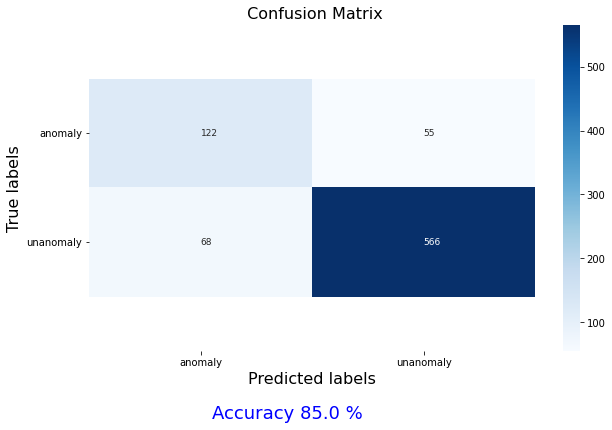

In [106]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(data_unseen['Anomaly_labels'],  true)
print("Confusion matrix is :\n ", cm)
annot_kws = {"ha": 'left',"va": 'center','size': 9}
plt.figure(figsize=(10,6))
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',cmap = 'Blues',annot_kws=annot_kws, ax=ax); 
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
# labels, title and ticks
ax.set_xlabel('Predicted labels',fontsize=16)
ax.set_ylabel('True labels',fontsize=16); 
plt.title(' Confusion Matrix',fontsize=16); 
plt.suptitle('Accuracy '+str(round(accuracy_score(data_unseen['Anomaly_labels'], true),2)*100)+' %',x=0.4, y=0, fontsize=18,c='blue'); 
plt.xticks(fontsize=10)
plt.yticks(fontsize=10,rotation=0)
ax.xaxis.set_ticklabels(['anomaly','unanomaly']);
ax.yaxis.set_ticklabels(['anomaly','unanomaly']);


### ET

In [113]:
true=[]
for i in range(len(new_prediction_et)):
  if new_prediction_et[i]==1:
    true.append('unanomaly')
  else: true.append('anomaly')  

In [114]:
from sklearn.metrics import  accuracy_score
print('Accuracy--------->',round(accuracy_score(data_unseen['Anomaly_labels'], true),2))

Accuracy---------> 0.87


Confusion matrix is :
  [[117  60]
 [ 49 585]]


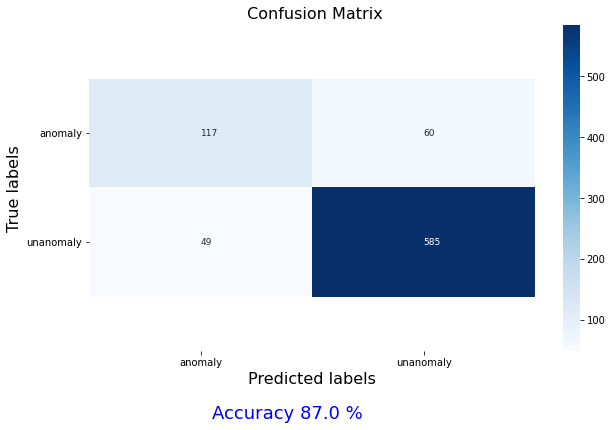

In [115]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(data_unseen['Anomaly_labels'],  true)
print("Confusion matrix is :\n ", cm)
annot_kws = {"ha": 'left',"va": 'center','size': 9}
plt.figure(figsize=(10,6))
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',cmap = 'Blues',annot_kws=annot_kws, ax=ax); 
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
# labels, title and ticks
ax.set_xlabel('Predicted labels',fontsize=16)
ax.set_ylabel('True labels',fontsize=16); 
plt.title(' Confusion Matrix',fontsize=16); 
plt.suptitle('Accuracy '+str(round(accuracy_score(data_unseen['Anomaly_labels'], true),2)*100)+' %',x=0.4, y=0, fontsize=18,c='blue'); 
plt.xticks(fontsize=10)
plt.yticks(fontsize=10,rotation=0)
ax.xaxis.set_ticklabels(['anomaly','unanomaly']);
ax.yaxis.set_ticklabels(['anomaly','unanomaly']);


### RF

In [110]:
true=[]
for i in range(len(new_prediction_rf)):
  if new_prediction_rf[i]==1:
    true.append('unanomaly')
  else: true.append('anomaly')  

In [111]:
from sklearn.metrics import  accuracy_score
print('Accuracy--------->',round(accuracy_score(data_unseen['Anomaly_labels'], true),2))

Accuracy---------> 0.87


Confusion matrix is :
  [[117  60]
 [ 49 585]]


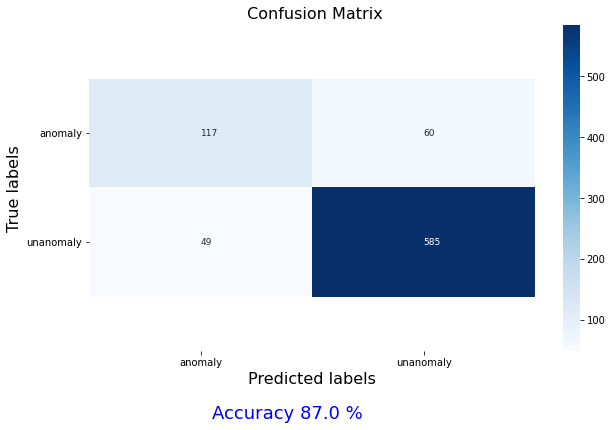

In [112]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(data_unseen['Anomaly_labels'],  true)
print("Confusion matrix is :\n ", cm)
annot_kws = {"ha": 'left',"va": 'center','size': 9}
plt.figure(figsize=(10,6))
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',cmap = 'Blues',annot_kws=annot_kws, ax=ax); 
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
# labels, title and ticks
ax.set_xlabel('Predicted labels',fontsize=16)
ax.set_ylabel('True labels',fontsize=16); 
plt.title(' Confusion Matrix',fontsize=16); 
plt.suptitle('Accuracy '+str(round(accuracy_score(data_unseen['Anomaly_labels'], true),2)*100)+' %',x=0.4, y=0, fontsize=18,c='blue'); 
plt.xticks(fontsize=10)
plt.yticks(fontsize=10,rotation=0)
ax.xaxis.set_ticklabels(['anomaly','unanomaly']);
ax.yaxis.set_ticklabels(['anomaly','unanomaly']);


# Output

In [120]:
drop_list_speed=[]

In [121]:
df_out=data_unseen[[ 'longitude', 'latitude',
       'speed', 'prediction']]

In [122]:
df_out['prediction'].value_counts()

unanomaly    645
anomaly      166
Name: prediction, dtype: int64

In [123]:
#drop bumpy road
for i in range(0,(len(df_out)-1)):
  if df_out['speed'].iloc[i] > 40 :
      drop_list_speed.append(i)
df_out.drop(df_out.index[drop_list_speed],inplace=True) 
    

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [124]:
df_out_pred_anomaly=df_out[df_out['prediction']=='anomaly'] 
len(df_out_pred_anomaly)

81

In [125]:
df_out_pred_unanomaly=df_out_pred=df_out[df_out['prediction']=='unanomaly']  
len(df_out_pred_unanomaly),len(df_out)

(552, 633)

In [126]:
# get lat and long 
latitude_anomaly=df_out_pred_anomaly['latitude'].values.tolist()
longitude_anomaly=df_out_pred_anomaly['longitude'].values.tolist()
latitude_unanomaly=df_out_pred_unanomaly['latitude'].values.tolist()
longitude_unanomaly=df_out_pred_unanomaly['longitude'].values.tolist()


In [128]:
len(latitude_anomaly),len(longitude_anomaly)


(81, 81)

In [129]:
len(latitude_unanomaly),len(longitude_unanomaly)

(552, 552)

# CSV output

In [130]:
out_csv_anomaly = pd.DataFrame(
    {'latitude': latitude_anomaly,
     'longitiude': longitude_anomaly,
    })
out_csv_unanomaly = pd.DataFrame(
    {'latitude': latitude_unanomaly,
     'longitiude': longitude_unanomaly,
    })

# MAPS


In [164]:
import folium
l=[]
for i in range(len(out_csv_anomaly)): 
  l.append([out_csv_anomaly['latitude'].iloc[i],out_csv_anomaly['longitiude'].iloc[i]])
phone_map = folium.Map()

# Top three smart phone companies by market share in 2016

# Adding markers to the map
for i in l:
    marker = folium.Circle(
    location=i,
    radius=0.5,
    color="red",
    fill=True,
    fill_color="red",
).add_to(phone_map)

# The last object in the cell always gets shown in the notebook
phone_map

# Geo Name

In [134]:
an=out_csv_anomaly

In [135]:
from geopy.geocoders import Nominatim

In [136]:
geolocator = Nominatim(user_agent="geoapiExercises")

In [137]:
city_name=[]
post_code=[]
road_name=[]
town_name=[]
for i in range(len(an)):
  # geolocator = Nominatim(user_agent="geoapiExercises")
  # Latitude & Longitude input
  Latitude = str(an['latitude'].iloc[i])
  Longitude = str(an['longitiude'].iloc[i])
  location = geolocator.reverse(Latitude+","+Longitude,timeout=100000)
  address = location.raw['address']
  city = address.get('city', '')
  postcode = address.get('postcode', '')
  roadname = address.get('road', '')
  town = address.get('town', '')
  town_name.append(town)
  post_code.append(postcode)
  road_name.append(roadname)
  city_name.append(city)


In [138]:
an['City']=city_name
an['Post_code']=post_code
an['Road']=road_name
an['Town']=town_name

In [139]:
from collections import Counter
l=Counter(an['Post_code'])

In [140]:
l

Counter({'11221': 19,
         '11614': 8,
         '11624': 1,
         '11631': 15,
         '12344': 28,
         '12411': 2,
         '12654': 4,
         '13766': 4})

# Start CLean road

In [141]:
def group_by_missing(seq):
    if not seq:
        return seq
    grouped = [[seq[0]]]
    for x in seq[1:]:
        if x == grouped[-1][-1] + 1:
            grouped[-1].append(x)
        else:
            grouped.append([x])
    return grouped

In [142]:
from collections import Counter

post_code=Counter(an['Post_code'])
post_code

Counter({'11221': 19,
         '11614': 8,
         '11624': 1,
         '11631': 15,
         '12344': 28,
         '12411': 2,
         '12654': 4,
         '13766': 4})

In [143]:
Post_keys=list(post_code.keys())
Post_keys

['11614', '13766', '11631', '11221', '12344', '11624', '12654', '12411']

In [144]:
Latitude=[]
Longitude=[]
Distance=[]
for i in Post_keys:## Post code For LOOp
  if post_code[i]<=2:
    continue
  else:
    print(i)
    df_road=an[an['Post_code']==str(i)]  
    road_list=Counter(df_road['Road'])
    road_keys=list(road_list.keys())
    for j in road_keys:## Road_name For LOOp
      if road_list[j]<=2:
        # print('true')
        continue
      else:
          print(j)
          df=df_road[df_road['Road']==j]
          import geopy.distance
          distance=[]
          for k in range(len(df)):##  start Calculate Distance
            # print('Distance')
            coords_1 = (df['latitude'].iloc[0], df['longitiude'].iloc[0])
            coords_2 = (df['latitude'].iloc[k], df['longitiude'].iloc[k])
            distance.append(round(geopy.distance.vincenty(coords_1, coords_2).m,2))## end Calculate Distance
          df['distance']=distance
          df.sort_values('distance',inplace = True)
          df.reset_index(inplace=True,drop=True)
          point_start=[]
          point_end=[]
          for m in range(len(df)):## Calculate near coordinates
               
              if m+1 != len(df):
                  coords_1 = (df['latitude'].iloc[m], df['longitiude'].iloc[m])
                  coords_2 = (df['latitude'].iloc[m+1], df['longitiude'].iloc[m+1])
              else:
                break    
              if round(geopy.distance.vincenty(coords_1, coords_2).m,2) <= 45 :
                  point_start.append(m)                  
              else:
                  coords_1 = (df['latitude'].iloc[m], df['longitiude'].iloc[m])
                  coords_2 = (df['latitude'].iloc[m-1], df['longitiude'].iloc[m-1]) 
                  if round(geopy.distance.vincenty(coords_1, coords_2).m,2) <= 45 :
                      point_end.append(m)## end Calculate near coordinates
          point_start = list( dict.fromkeys(point_start) )
          point_end = list( dict.fromkeys(point_end) )
          list_p=group_by_missing(point_start)
          df_try=df.copy()
          lat_new=[]
          long_new=[]
          distance_new=[] 
          for n in range(len(list_p)): ## Calucalate distance for alert and get points
               
              coords_1 = (df_try['latitude'].iloc[list_p[n][0]], df_try['longitiude'].iloc[list_p[n][0]])
              coords_2 = (df_try['latitude'].iloc[list_p[n][-1]], df_try['longitiude'].iloc[list_p[n][-1]])
              distance_new.append(round(geopy.distance.vincenty(coords_1, coords_2).m,2))
              lat_new.append(df_try['latitude'].iloc[list_p[n][0]])
              long_new.append(df_try['longitiude'].iloc[list_p[n][0]])          
          df_try_2=df.copy()
          df_try_2.reset_index(inplace=True,drop=True)
          df_try_2.drop(['distance'], axis=1, inplace=True)  
          for o in range(len(list_p)): ## Calculate start and end point
              
              start=list_p[o][0]
              end=list_p[o][-1]
              l=[]
              for e in range(start,end+1):
                
                l.append(e)
              df_try_2.drop(l,axis=0,inplace=True)    
          df_try_2['distance']=0
          dict = {'latitude': lat_new, 'longitiude': long_new, 'distance': distance_new} 
          df_1 = pd.DataFrame(dict)
          for q in point_end: ## drop end point
              df_try_2.drop(q,inplace=True)
          df_try_2=df_try_2.append(df_1)
          for f in range(len(df_try_2)):
            Latitude.append(df_try_2['latitude'].iloc[f])
            Longitude.append(df_try_2['longitiude'].iloc[f])
            Distance.append(df_try_2['distance'].iloc[f])
            # print(len(Latitude))
          # df_try_2=pd.DataFrame(None)
                     





11614
شارع كورنيش النيل
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
1
2
3
13766
شارع كورنيش النيل
Distance
Distance
Distance
4
5
6
11631
شارع كورنيش النيل
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
7
8
9
10
11
12
13
14
11221
شارع كورنيش النيل
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
15
16
17
18
19
20
21
22
12344
شارع كورنيش النيل
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
Distance
23
24
25
26
27
28
29
30
كوبرى 6 أكتوبر
Distance
Distance
Distance
Distance
Distance
Distance
Distance
31
32
33
34
12654
شارع المتحف الزراعى
Distance
Distance
Distance
Distance
35
36


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [145]:
dict = {'latitude': Latitude, 'longitiude': Longitude, 'distance': Distance} 
Anomaly = pd.DataFrame(dict)
Anomaly.head()

,latitude,longitiude,distance
0,30.104761,31.244907,0.00
1,30.103885,31.244653,5.79
2,30.104640,31.245035,12.02
3,30.104737,31.244173,0.00
4,30.103520,31.241778,0.00


In [146]:
len(Anomaly)

36

# **Maps**

In [155]:
import folium
l=[]
for i in range(len(Anomaly)): 
  l.append([an['latitude'].iloc[i],an['longitiude'].iloc[i]])
mid_l=[]
rough_road=[]
for i in range(len(Anomaly)): 
  if(Anomaly['distance'].iloc[i]>60):
      rough_road.append([Anomaly['latitude'].iloc[i],Anomaly['longitiude'].iloc[i]])
  else:
    mid_l.append([Anomaly['latitude'].iloc[i],Anomaly['longitiude'].iloc[i]])  

In [156]:
mid_l

[[30.1047613, 31.2449073],
 [30.1038847, 31.2446525],
 [30.1046402, 31.2450348],
 [30.1047371, 31.2441731],
 [30.1035197, 31.2417785],
 [30.1038366, 31.2420177],
 [30.0916296, 31.2351339],
 [30.0805584, 31.2308132],
 [30.0774548, 31.2294985],
 [30.0744326, 31.2277253],
 [30.0811671, 31.230858],
 [30.0757156, 31.2285592],
 [30.0750432, 31.2281003],
 [30.0744326, 31.2277253],
 [30.0698085, 31.2268218],
 [30.0693085, 31.2267973],
 [30.0680192, 31.2267918],
 [30.0738172, 31.2274298],
 [30.073366, 31.2273621],
 [30.0712899, 31.2270743],
 [30.0707706, 31.226994],
 [30.0633351, 31.2270466],
 [30.0500061, 31.2312139],
 [30.0724143, 31.227342],
 [30.0546502, 31.2294505],
 [30.052739, 31.2302891],
 [30.0518505, 31.2306964],
 [30.0513466, 31.2309354],
 [30.0485361, 31.2191757],
 [30.0476712, 31.2134994],
 [30.0494472, 31.2310331],
 [30.0483296, 31.217866],
 [30.0477611, 31.2140312],
 [30.0478397, 31.2147018]]

In [165]:
phone_map = folium.Map()

# Top three smart phone companies by market share in 2016

# Adding markers to the map
x=0
for i in l:
    marker = folium.Circle(
    location=i,
    radius=1,
    color="red",
    fill=True,
    fill_color="red",
    tooltip =x
).add_to(phone_map)
    x=x+1
for j in mid_l:
  marker = folium.Circle(
    location=j,
    radius=0.2,
    color="blue",
    fill=True,
    fill_color="blue",
    tooltip =i
  ).add_to(phone_map)
for j in rough_road:
  marker = folium.Marker(
    location=j,
    
  ).add_to(phone_map)
# The last object in the cell always gets shown in the notebook
phone_map




In [158]:
alert=[]
for i in range(len(Anomaly)):
  if Anomaly['distance'].iloc[i] > 60:
    alert.append(1)
  else:
    alert.append(0)  

In [159]:
Anomaly['Alert_Type']=alert

In [160]:
Anomaly

,latitude,longitiude,distance,Alert_Type
0,30.104761,31.244907,0.00,0
1,30.103885,31.244653,5.79,0
2,30.104640,31.245035,12.02,0
3,30.104737,31.244173,0.00,0
4,30.103520,31.241778,0.00,0
5,30.103837,31.242018,0.00,0
6,30.091630,31.235134,0.00,0
7,30.080558,31.230813,0.00,0
8,30.077455,31.229498,0.00,0
9,30.074433,31.227725,0.00,0


In [161]:
Anomaly.to_csv('Anomaly_Final.csv',index=False)